
0: 480x640 2 persons, 2 chairs, 194.2ms
Speed: 3.3ms preprocess, 194.2ms inference, 10.3ms postprocess per image at shape (1, 3, 480, 640)


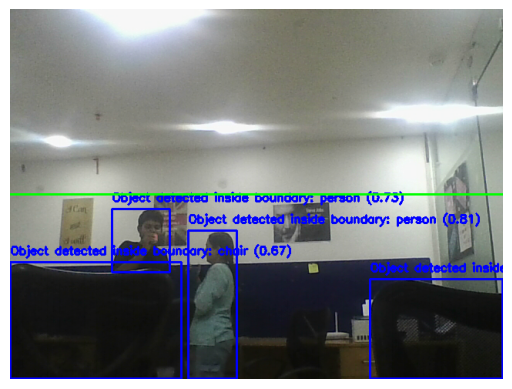


0: 480x640 2 persons, 2 chairs, 240.7ms
Speed: 2.6ms preprocess, 240.7ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


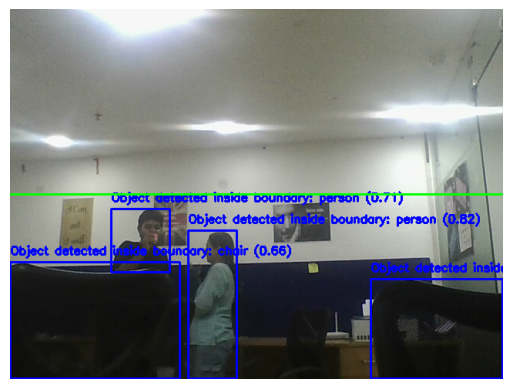


0: 480x640 2 persons, 4 chairs, 222.1ms
Speed: 0.0ms preprocess, 222.1ms inference, 10.3ms postprocess per image at shape (1, 3, 480, 640)


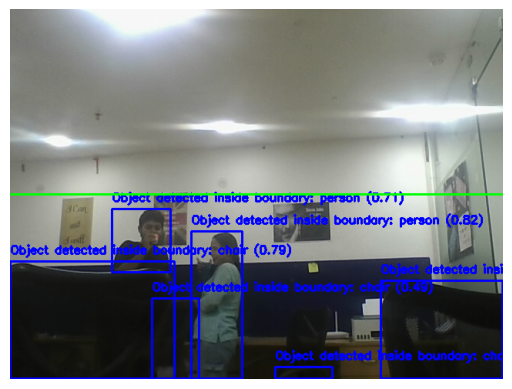


0: 480x640 2 persons, 3 chairs, 248.1ms
Speed: 4.5ms preprocess, 248.1ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


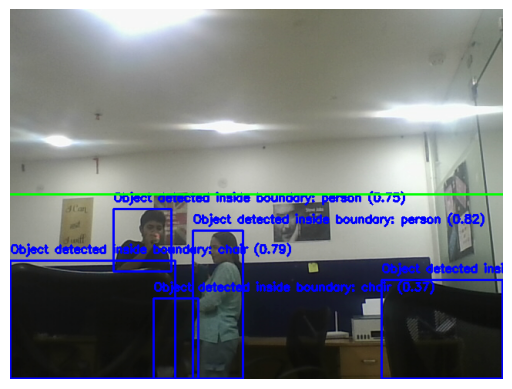


0: 480x640 2 persons, 4 chairs, 197.5ms
Speed: 7.3ms preprocess, 197.5ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


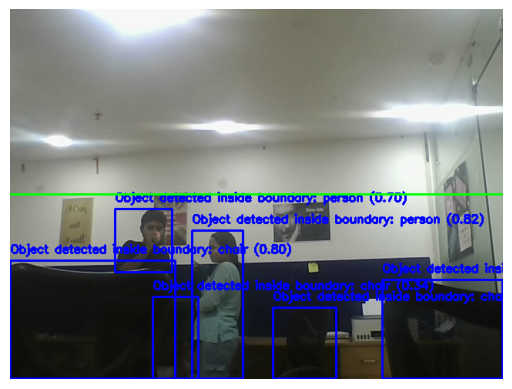


0: 480x640 2 persons, 3 chairs, 208.8ms
Speed: 5.0ms preprocess, 208.8ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


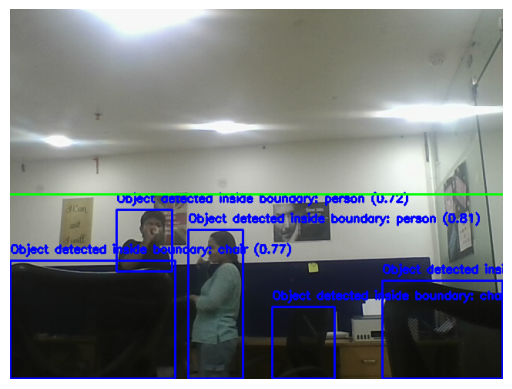


0: 480x640 2 persons, 2 chairs, 321.8ms
Speed: 12.3ms preprocess, 321.8ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


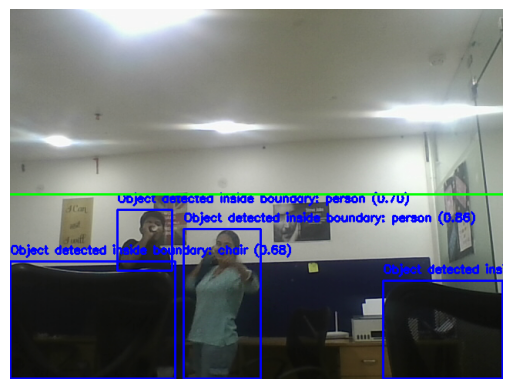


0: 480x640 2 persons, 2 chairs, 193.7ms
Speed: 1.5ms preprocess, 193.7ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


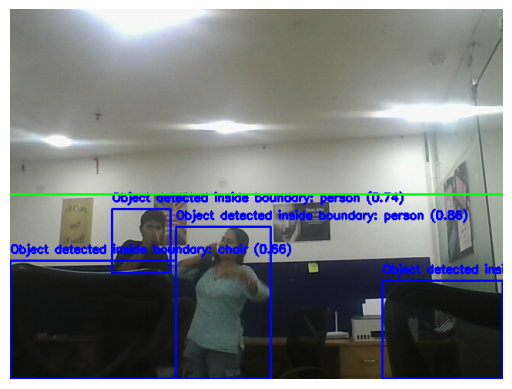


0: 480x640 2 persons, 3 chairs, 251.4ms
Speed: 5.5ms preprocess, 251.4ms inference, 3.1ms postprocess per image at shape (1, 3, 480, 640)


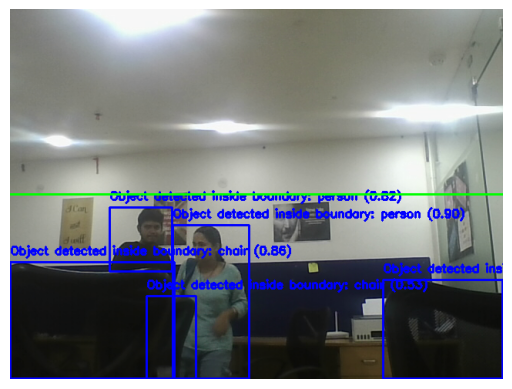


0: 480x640 4 persons, 2 chairs, 182.3ms
Speed: 2.1ms preprocess, 182.3ms inference, 10.1ms postprocess per image at shape (1, 3, 480, 640)


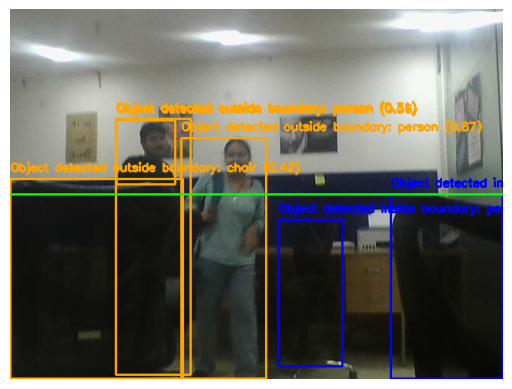


0: 480x640 3 persons, 3 chairs, 243.0ms
Speed: 4.8ms preprocess, 243.0ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


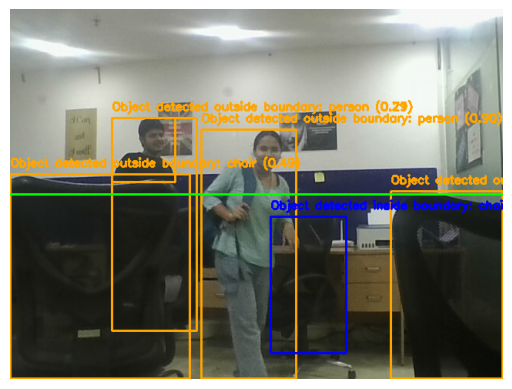


0: 480x640 2 persons, 2 chairs, 221.9ms
Speed: 1.8ms preprocess, 221.9ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


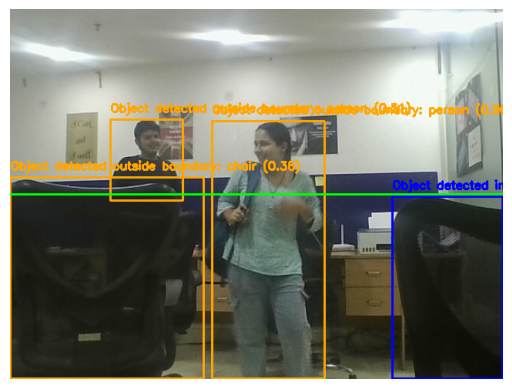


0: 480x640 2 persons, 1 chair, 180.6ms
Speed: 2.0ms preprocess, 180.6ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


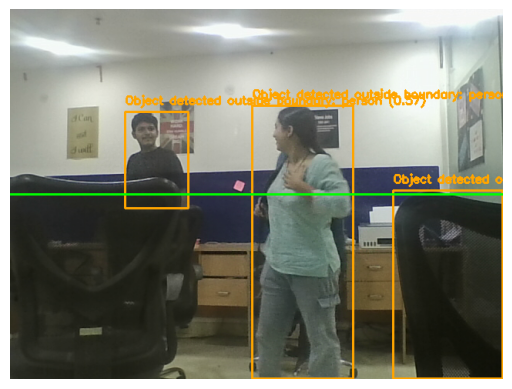


0: 480x640 3 persons, 1 backpack, 1 chair, 255.0ms
Speed: 12.4ms preprocess, 255.0ms inference, 9.7ms postprocess per image at shape (1, 3, 480, 640)


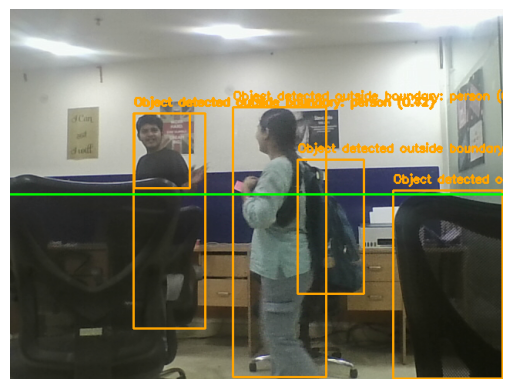


0: 480x640 2 persons, 1 backpack, 2 chairs, 199.0ms
Speed: 5.1ms preprocess, 199.0ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)


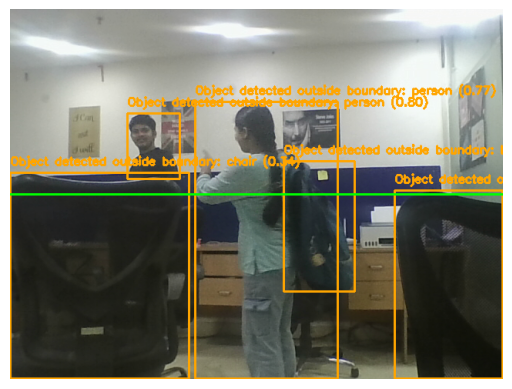


0: 480x640 2 persons, 1 chair, 204.1ms
Speed: 4.9ms preprocess, 204.1ms inference, 6.1ms postprocess per image at shape (1, 3, 480, 640)


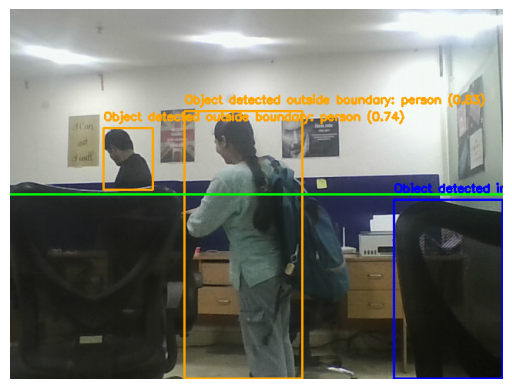


0: 480x640 2 persons, 1 backpack, 1 chair, 198.8ms
Speed: 3.8ms preprocess, 198.8ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


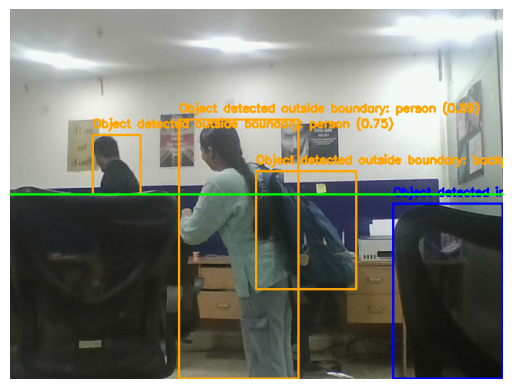


0: 480x640 2 persons, 1 chair, 232.2ms
Speed: 0.0ms preprocess, 232.2ms inference, 4.6ms postprocess per image at shape (1, 3, 480, 640)


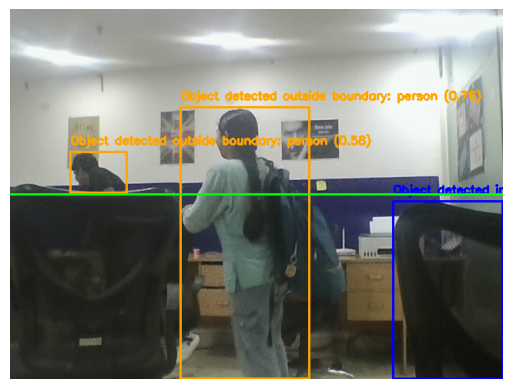

In [10]:
import cv2
from ultralytics import YOLO
import time
import matplotlib.pyplot as plt

# Load the YOLOv8 model from local file
model_path =  r'E:\dustbin_projrct\poubelles.v3i.yolov8\yolov8n.pt'  # Update this path to your downloaded model
model = YOLO(model_path)

# Start capturing video from the laptop's camera
cap = cv2.VideoCapture(0)

# Define boundary line coordinates for 2 meters
frame_width = 640  # Width of the frame
frame_height = 480  # Height of the frame
boundary_y = frame_height // 2  # Center of the frame for horizontal boundary

# Get the current time
start_time = time.time()

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Perform object detection
    results = model(frame)

    # Check if results are available
    if results:
        boxes = results[0].boxes  # Access the first result
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            conf = box.conf[0].item()
            cls = box.cls[0].item()

            # Check if object is within the boundary
            # Object is inside if its top edge (y1) is below the boundary line
            if y1 > boundary_y:  
                label = f"Object detected inside boundary: {model.names[int(cls)]} ({conf:.2f})"
                color = (255, 0, 0)  # Blue for inside
            else:
                label = f"Object detected outside boundary: {model.names[int(cls)]} ({conf:.2f})"
                color = (0, 165, 255)  # Orange for outside

            # Draw bounding box and label on the frame
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
            cv2.putText(frame, label, (int(x1), int(y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Draw the boundary line (edge to edge)
    cv2.line(frame, (0, boundary_y), (frame_width, boundary_y), (0, 255, 0), 2)  # Green line

    # Display the frame using Matplotlib
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.axis('off')  # Hide axis
    plt.show(block=False)  # Non-blocking display
    plt.pause(0.01)  # Brief pause to allow the display to update

    # Break the loop if 10 seconds have passed
    if time.time() - start_time > 10:  # 10 seconds
        break

# Release the camera
cap.release()



0: 480x640 1 garbage, 987.8ms
Speed: 3.3ms preprocess, 987.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 512x352 (no detections), 1323.6ms
Speed: 3.0ms preprocess, 1323.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 352)


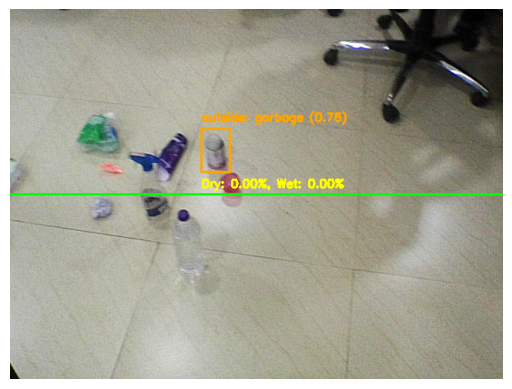


0: 480x640 2 garbages, 1230.3ms
Speed: 25.2ms preprocess, 1230.3ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x512 1 Dry Waste, 1849.2ms
Speed: 2.0ms preprocess, 1849.2ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 512)

0: 512x416 1 Dry Waste, 2462.7ms
Speed: 1.0ms preprocess, 2462.7ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 416)


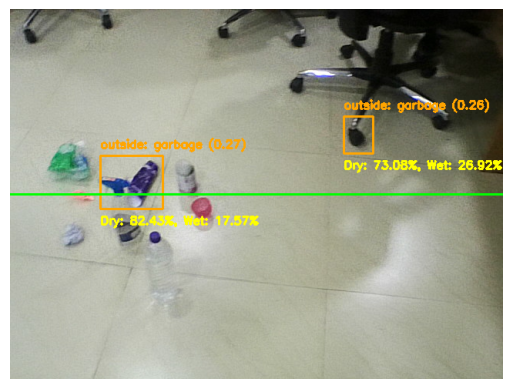

In [10]:
import cv2
import numpy as np
from ultralytics import YOLO
import time
import matplotlib.pyplot as plt

# Load the YOLO garbage detection model and dry/wet model
garbage_model_path = 'garbagev1.pt'  # Update with the correct model path
dry_wet_model_path = 'Drybest.pt'  # Update with the correct model path
garbage_model = YOLO(garbage_model_path)
dry_wet_model = YOLO(dry_wet_model_path)

# Start capturing video from the laptop's camera
cap = cv2.VideoCapture(0)

# Define boundary parameters
frame_width = 640
frame_height = 480
boundary_y = frame_height // 2  # Horizontal boundary in the middle of the frame
boundary_thickness = 2  # Thickness of the boundary line

# Get the current time
start_time = time.time()

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Perform garbage detection
    garbage_results = garbage_model(frame)

    # Check if results are available
    if garbage_results:
        boxes = garbage_results[0].boxes  # Access the first result
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            conf = box.conf[0].item()
            cls = box.cls[0].item()

            # Calculate the center of the bounding box
            center_y = (y1 + y2) / 2  # Vertical center

            # Check if the object is within the boundary
            if center_y < boundary_y:
                label = f"outside: {garbage_model.names[int(cls)]} ({conf:.2f})"
                color = (0, 165, 255)  # Orange for outside
            else:
                label = f"inside: {garbage_model.names[int(cls)]} ({conf:.2f})"
                color = (255, 0, 0)  # Blue for inside

            # Draw bounding box and label on the frame
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
            cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

            # Extract the garbage region for dry/wet classification
            garbage_region = frame[int(y1):int(y2), int(x1):int(x2)]

            # Ensure the region is valid
            if garbage_region.size > 0:
                dry_wet_results = dry_wet_model(garbage_region)

                # Check if results are available
                if dry_wet_results and dry_wet_results[0].boxes:
                    dry_class_conf = dry_wet_results[0].boxes[0].conf[0].item()
                    wet_class_conf = 1.0 - dry_class_conf  # Assuming binary classification

                    # Calculate percentages
                    dry_percent = dry_class_conf * 100
                    wet_percent = wet_class_conf * 100
                else:
                    dry_percent = 0.0
                    wet_percent = 0.0
            else:
                dry_percent = 0.0
                wet_percent = 0.0

            # Add dryness and wetness percentages to the output
            cv2.putText(frame, f"Dry: {dry_percent:.2f}%, Wet: {wet_percent:.2f}%", (int(x1), int(y2) + 20),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2)

    # Draw the straight boundary line
    cv2.line(frame, (0, boundary_y), (frame_width, boundary_y), (0, 255, 0), boundary_thickness)  # Green for boundary

    # Convert frame to RGB for matplotlib
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Display the frame using matplotlib
    plt.imshow(frame_rgb)
    plt.axis('off')  # Hide axes
    plt.show(block=False)
    plt.pause(0.01)  # Pause to allow the image to display
    plt.clf()  # Clear the current figure

    # Break the loop if 10 seconds have passed
    if time.time() - start_time > 10:  # 10 seconds
        break

# Release the camera
cap.release()
plt.close()  # Close the matplotlib figure



0: 384x480 (no detections), 844.7ms
Speed: 3.0ms preprocess, 844.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 480)


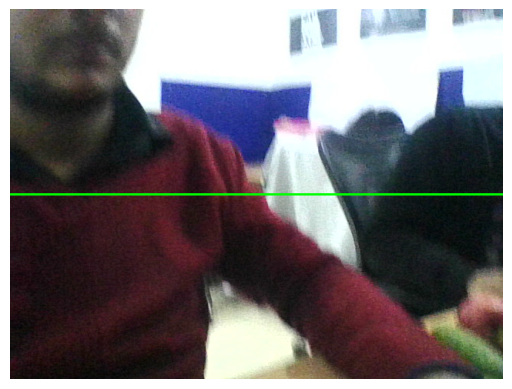


0: 384x480 (no detections), 818.5ms
Speed: 3.0ms preprocess, 818.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 480)


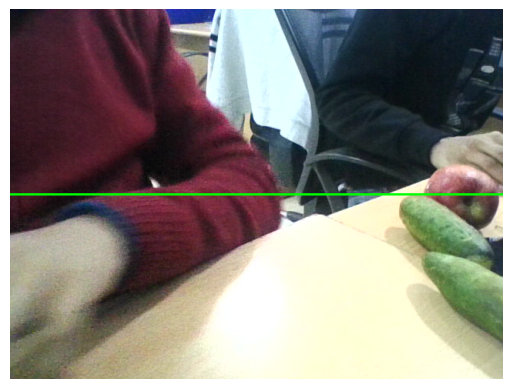


0: 384x480 (no detections), 755.1ms
Speed: 3.2ms preprocess, 755.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 480)


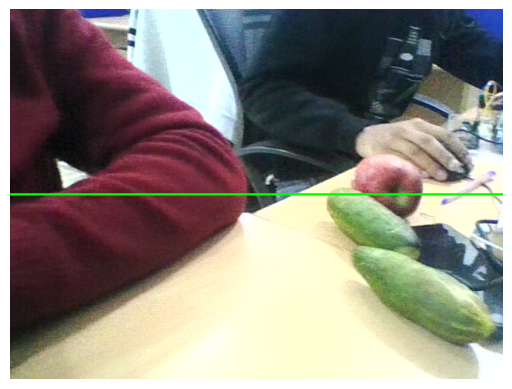


0: 384x480 (no detections), 593.7ms
Speed: 3.0ms preprocess, 593.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 480)


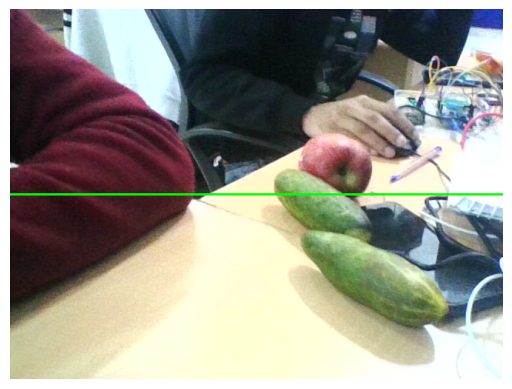


0: 384x480 (no detections), 628.3ms
Speed: 4.7ms preprocess, 628.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 480)


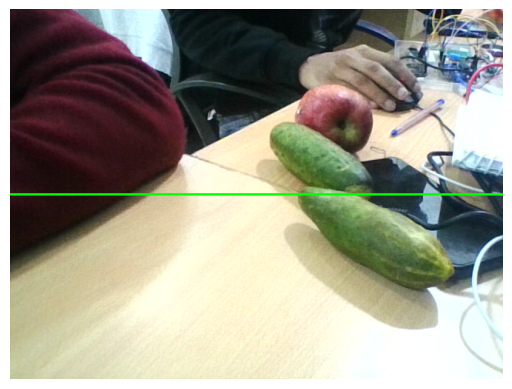


0: 384x480 (no detections), 503.8ms
Speed: 3.5ms preprocess, 503.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 480)


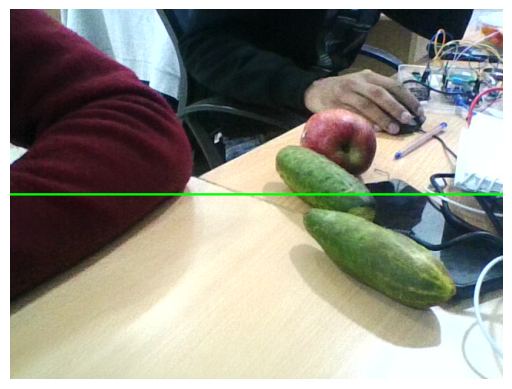


0: 384x480 (no detections), 774.9ms
Speed: 3.0ms preprocess, 774.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 480)


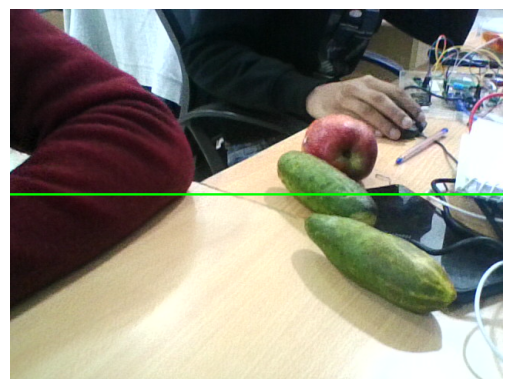


0: 384x480 (no detections), 709.7ms
Speed: 5.0ms preprocess, 709.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 480)


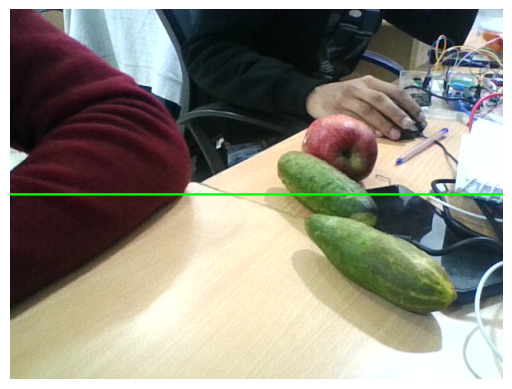


0: 384x480 (no detections), 646.7ms
Speed: 3.0ms preprocess, 646.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 480)


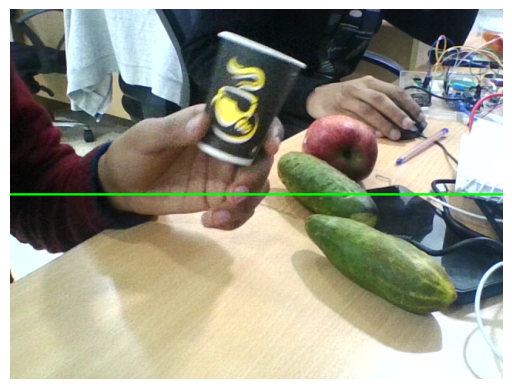

In [15]:
import cv2
import numpy as np
from ultralytics import YOLO
import time
import matplotlib.pyplot as plt

# Load the YOLO garbage detection model and dry/wet model
garbage_model_path = 'garbagebest.pt'  # Update with the correct model path
dry_wet_model_path = 'Drybest.pt'  # Update with the correct model path
garbage_model = YOLO(garbage_model_path)
dry_wet_model = YOLO(dry_wet_model_path)

# Start capturing video from the laptop's camera
cap = cv2.VideoCapture(0)

# Define boundary parameters
frame_width = 640
frame_height = 480
boundary_y = frame_height // 2  # Horizontal boundary in the middle of the frame
boundary_thickness = 2  # Thickness of the boundary line

# Get the current time
start_time = time.time()

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Perform garbage detection
    garbage_results = garbage_model(frame)

    # Check if results are available
    if garbage_results:
        boxes = garbage_results[0].boxes  # Access the first result
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            conf = box.conf[0].item()
            cls = box.cls[0].item()

            # Calculate the center of the bounding box
            center_y = (y1 + y2) / 2  # Vertical center

            # Check if the object is within the boundary
            if center_y < boundary_y:
                label = f"outside: {garbage_model.names[int(cls)]} ({conf:.2f})"
                color = (0, 165, 255)  # Orange for outside
            else:
                label = f"inside: {garbage_model.names[int(cls)]} ({conf:.2f})"
                color = (255, 0, 0)  # Blue for inside

            # Draw bounding box and label on the frame
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
            cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

            # Extract the garbage region for dry/wet classification
            garbage_region = frame[int(y1):int(y2), int(x1):int(x2)]

            # Ensure the region is valid
            if garbage_region.size > 0:
                dry_wet_results = dry_wet_model(garbage_region)

                # Check if results are available
                if dry_wet_results and dry_wet_results[0].boxes:
                    dry_class_conf = dry_wet_results[0].boxes[0].conf[0].item()
                    wet_class_conf = 1.0 - dry_class_conf  # Assuming binary classification

                    # Calculate percentages
                    dry_percent = dry_class_conf * 100
                    wet_percent = wet_class_conf * 100
                else:
                    dry_percent = 0.0
                    wet_percent = 0.0
            else:
                dry_percent = 0.0
                wet_percent = 0.0

            # Add dryness and wetness percentages to the output
            cv2.putText(frame, f"Dry: {dry_percent:.2f}%, Wet: {wet_percent:.2f}%", (int(x1), int(y2) + 20),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2)

    # Draw the straight boundary line
    cv2.line(frame, (0, boundary_y), (frame_width, boundary_y), (0, 255, 0), boundary_thickness)  # Green for boundary

    # Convert frame to RGB for matplotlib
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Display the frame using matplotlib
    plt.imshow(frame_rgb)
    plt.axis('off')  # Hide axes
    plt.show(block=False)
    plt.pause(0.01)  # Pause to allow the image to display
    plt.clf()  # Clear the current figure

    # Break the loop if 10 seconds have passed
    if time.time() - start_time > 10:  # 10 seconds
        break

# Release the camera
cap.release()
plt.close()  # Close the matplotlib figure



0: 384x480 (no detections), 875.0ms
Speed: 59.1ms preprocess, 875.0ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 480)


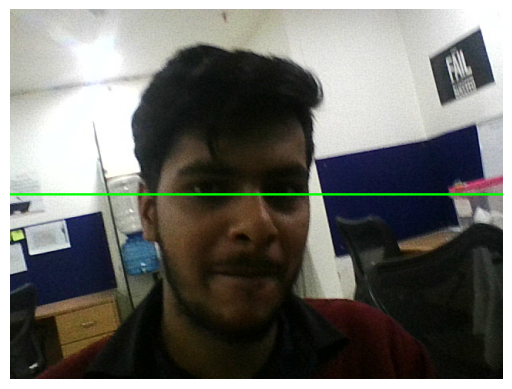


0: 384x480 (no detections), 608.2ms
Speed: 5.0ms preprocess, 608.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 480)


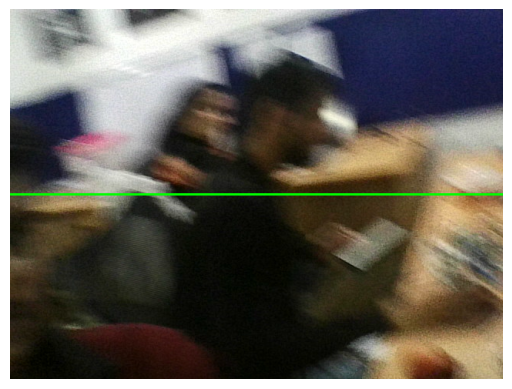


0: 384x480 (no detections), 578.3ms
Speed: 3.0ms preprocess, 578.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 480)


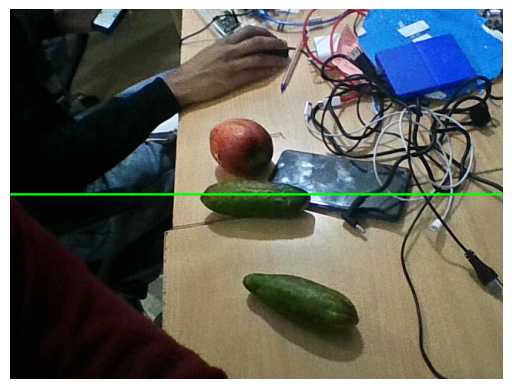


0: 384x480 2 garbages, 516.9ms
Speed: 3.0ms preprocess, 516.9ms inference, 14.0ms postprocess per image at shape (1, 3, 384, 480)

0: 416x512 1 Wet Waste, 1353.9ms
Speed: 7.0ms preprocess, 1353.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 512)

0: 512x224 (no detections), 735.4ms
Speed: 1.0ms preprocess, 735.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 224)


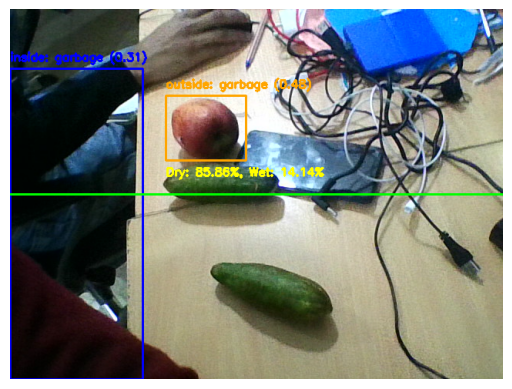


0: 384x480 1 garbage, 490.4ms
Speed: 3.0ms preprocess, 490.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 480)

0: 448x512 1 Wet Waste, 1712.0ms
Speed: 2.6ms preprocess, 1712.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 512)


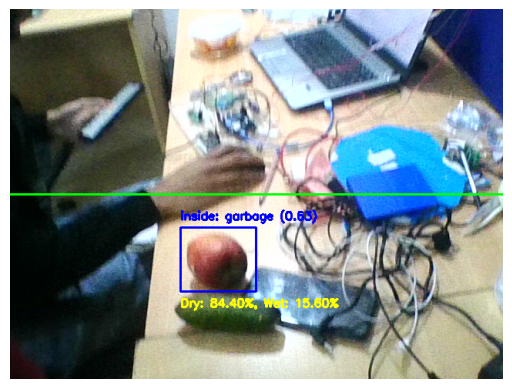

In [13]:
import cv2
import numpy as np
from ultralytics import YOLO
import time
import matplotlib.pyplot as plt

# Load the YOLO garbage detection model and dry/wet model
garbage_model_path = 'garbagebest.pt'  # Update with the correct model path
dry_wet_model_path = 'Drybest.pt'  # Update with the correct model path
garbage_model = YOLO(garbage_model_path)
dry_wet_model = YOLO(dry_wet_model_path)

# Start capturing video from the laptop's camera
cap = cv2.VideoCapture(0)

# Define boundary parameters
frame_width = 640
frame_height = 480
boundary_y = frame_height // 2  # Horizontal boundary in the middle of the frame
boundary_thickness = 2  # Thickness of the boundary line

# Get the current time
start_time = time.time()

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Perform garbage detection
    garbage_results = garbage_model(frame)

    # Check if results are available
    if garbage_results:
        boxes = garbage_results[0].boxes  # Access the first result
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            conf = box.conf[0].item()
            cls = box.cls[0].item()

            # Calculate the center of the bounding box
            center_y = (y1 + y2) / 2  # Vertical center

            # Check if the object is within the boundary
            if center_y < boundary_y:
                label = f"outside: {garbage_model.names[int(cls)]} ({conf:.2f})"
                color = (0, 165, 255)  # Orange for outside
            else:
                label = f"inside: {garbage_model.names[int(cls)]} ({conf:.2f})"
                color = (255, 0, 0)  # Blue for inside

            # Draw bounding box and label on the frame
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
            cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

            # Extract the garbage region for dry/wet classification
            garbage_region = frame[int(y1):int(y2), int(x1):int(x2)]

            # Ensure the region is valid
            if garbage_region.size > 0:
                dry_wet_results = dry_wet_model(garbage_region)

                # Check if results are available
                if dry_wet_results and dry_wet_results[0].boxes:
                    dry_class_conf = dry_wet_results[0].boxes[0].conf[0].item()
                    wet_class_conf = 1.0 - dry_class_conf  # Assuming binary classification

                    # Calculate percentages
                    dry_percent = dry_class_conf * 100
                    wet_percent = wet_class_conf * 100
                else:
                    dry_percent = 0.0
                    wet_percent = 0.0
            else:
                dry_percent = 0.0
                wet_percent = 0.0

            # Add dryness and wetness percentages to the output
            cv2.putText(frame, f"Dry: {dry_percent:.2f}%, Wet: {wet_percent:.2f}%", (int(x1), int(y2) + 20),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2)

    # Draw the straight boundary line
    cv2.line(frame, (0, boundary_y), (frame_width, boundary_y), (0, 255, 0), boundary_thickness)  # Green for boundary

    # Convert frame to RGB for matplotlib
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Display the frame using matplotlib
    plt.imshow(frame_rgb)
    plt.axis('off')  # Hide axes
    plt.show(block=False)
    plt.pause(0.01)  # Pause to allow the image to display
    plt.clf()  # Clear the current figure

    # Break the loop if 10 seconds have passed
    if time.time() - start_time > 10:  # 10 seconds
        break

# Release the camera
cap.release()
plt.close()  # Close the matplotlib figure
